In [66]:
import numpy as np
import pandas as pd 
import seaborn as sns 
import io
import requests
import plotly as px
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVR
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score

In [48]:
df=pd.read_csv('ElectionData.csv')

In [3]:
df.head(2)

,TimeElapsed,time,territoryName,totalMandates,availableMandates,numParishes,numParishesApproved,blankVotes,blankVotesPercentage,nullVotes,...,pre.votersPercentage,pre.subscribedVoters,pre.totalVoters,Party,Mandates,Percentage,validVotesPercentage,Votes,Hondt,FinalMandates
0,0,2019-10-06 20:10:02,Território Nacional,0,226,3092,1081,9652,2.5,8874,...,52.66,813743,428546,PS,0,38.29,40.22,147993,94,106
1,0,2019-10-06 20:10:02,Território Nacional,0,226,3092,1081,9652,2.5,8874,...,52.66,813743,428546,PPD/PSD,0,33.28,34.95,128624,81,77


In [4]:
df.describe()

,TimeElapsed,totalMandates,availableMandates,numParishes,numParishesApproved,blankVotes,blankVotesPercentage,nullVotes,nullVotesPercentage,votersPercentage,...,pre.nullVotesPercentage,pre.votersPercentage,pre.subscribedVoters,pre.totalVoters,Mandates,Percentage,validVotesPercentage,Votes,Hondt,FinalMandates
count,21643.000000,21643.000000,21643.000000,21643.000000,21643.000000,21643.000000,21643.000000,21643.000000,21643.000000,21643.000000,...,21643.000000,21643.000000,2.164300e+04,2.164300e+04,21643.000000,21643.000000,21643.000000,2.164300e+04,21643.000000,21643.000000
mean,133.146052,11.544795,11.499284,309.956013,261.090237,8875.066673,2.621629,6148.068752,1.961471,51.983722,...,1.777442,54.549372,6.378503e+05,3.594932e+05,0.565495,4.968484,5.207232,1.585209e+04,1.126138,1.126138
std,77.651193,31.314567,31.738783,659.055911,583.377428,21484.874088,0.795289,14735.469269,0.375250,4.854380,...,0.388798,4.964948,1.544418e+06,8.763729e+05,4.421804,10.379967,10.881108,9.310605e+04,6.293552,6.872644
min,0.000000,0.000000,0.000000,54.000000,3.000000,19.000000,0.530000,39.000000,1.340000,35.980000,...,1.140000,40.870000,6.383000e+03,3.215000e+03,0.000000,0.020000,0.020000,1.000000e+00,0.000000,0.000000
25%,65.000000,1.000000,0.000000,75.000000,67.000000,1188.000000,2.230000,1094.000000,1.720000,50.290000,...,1.520000,51.210000,1.289260e+05,6.964400e+04,0.000000,0.220000,0.230000,2.360000e+02,0.000000,0.000000
50%,135.000000,4.000000,3.000000,147.000000,120.000000,2998.000000,2.640000,2232.000000,1.870000,53.130000,...,1.690000,56.260000,2.284970e+05,1.102730e+05,0.000000,0.620000,0.650000,7.900000e+02,0.000000,0.000000
75%,200.000000,9.000000,9.000000,242.000000,208.000000,6889.000000,2.980000,4121.000000,2.230000,54.550000,...,1.970000,58.220000,3.933140e+05,2.276200e+05,0.000000,3.010000,3.160000,4.510000e+03,0.000000,0.000000
max,265.000000,226.000000,226.000000,3092.000000,3092.000000,129599.000000,5.460000,88539.000000,3.350000,59.870000,...,3.120000,62.580000,9.439701e+06,5.380451e+06,106.000000,49.110000,51.420000,1.866407e+06,94.000000,106.000000


In [5]:
df.columns

Index(['TimeElapsed', 'time', 'territoryName', 'totalMandates',
       'availableMandates', 'numParishes', 'numParishesApproved', 'blankVotes',
       'blankVotesPercentage', 'nullVotes', 'nullVotesPercentage',
       'votersPercentage', 'subscribedVoters', 'totalVoters', 'pre.blankVotes',
       'pre.blankVotesPercentage', 'pre.nullVotes', 'pre.nullVotesPercentage',
       'pre.votersPercentage', 'pre.subscribedVoters', 'pre.totalVoters',
       'Party', 'Mandates', 'Percentage', 'validVotesPercentage', 'Votes',
       'Hondt', 'FinalMandates'],
      dtype='object')

C:\Users\GT\Anaconda3\lib\site-packages\matplotlib\figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


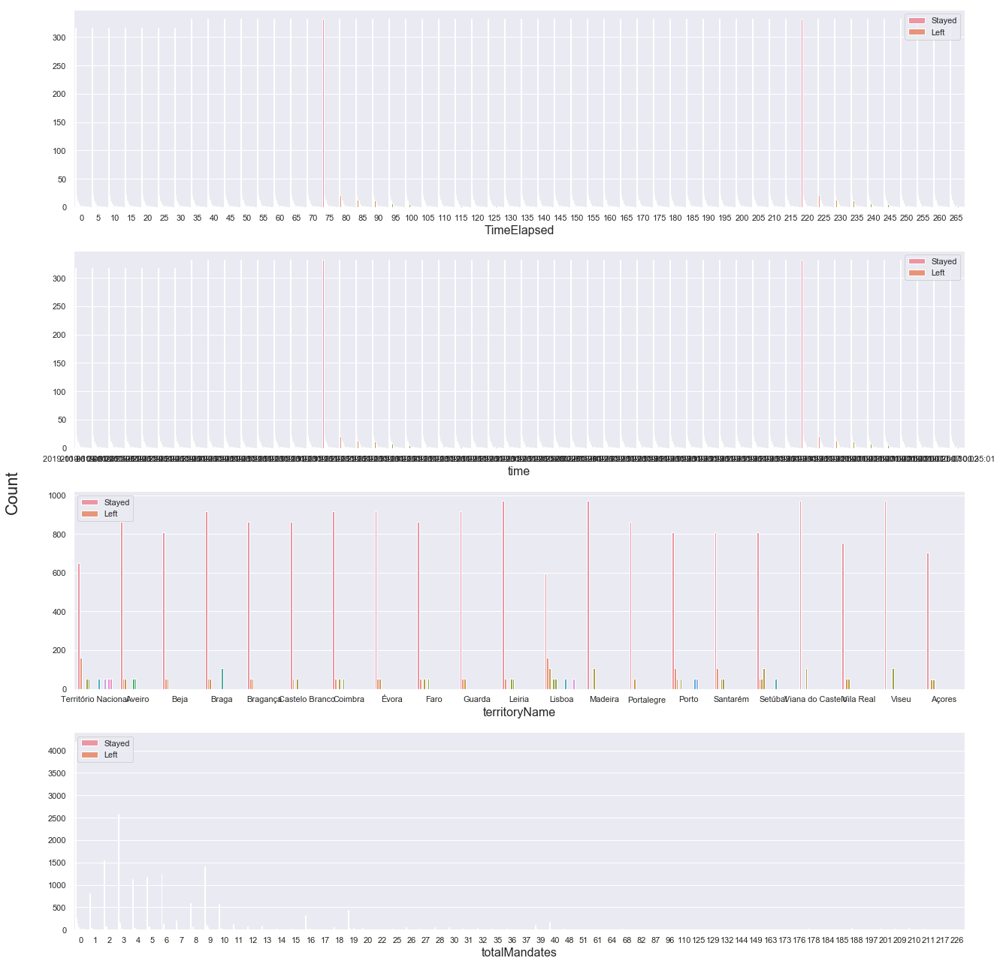

In [7]:
f, axes = plt.subplots(4, 1, figsize=(18,18), tight_layout=True)
x_vars = ['TimeElapsed', 'time', 'territoryName', 'totalMandates',
       'availableMandates', 'numParishes', 'numParishesApproved', 'blankVotes',
       'blankVotesPercentage', 'nullVotes', 'nullVotesPercentage',
       'votersPercentage', 'subscribedVoters', 'totalVoters', 'pre.blankVotes',
       'pre.blankVotesPercentage', 'pre.nullVotes', 'pre.nullVotesPercentage',
       'pre.votersPercentage', 'pre.subscribedVoters', 'pre.totalVoters',
       'Party', 'Mandates', 'Percentage', 'validVotesPercentage', 'Votes',
       'Hondt']
for ax, x in zip(axes, x_vars):
    sns.countplot(x=x, hue='FinalMandates', data=df, ax=ax)
    ax.set_xlabel(x, size=16)
    ax.set_ylabel("")
    ax.legend(['Stayed', 'Left'])

f.text(x=-0.0275, y=0.5, s='Count', rotation=90, size=22)
plt.show()

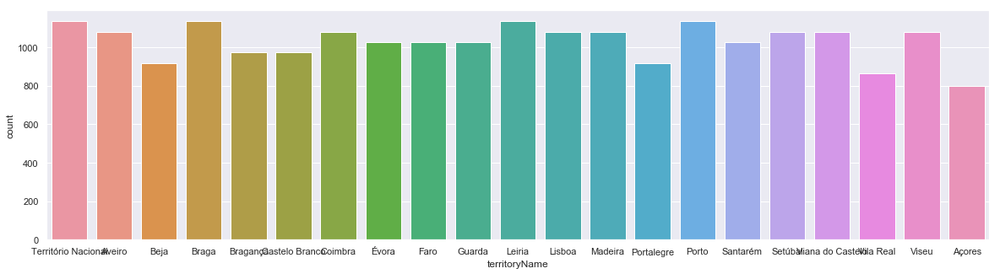

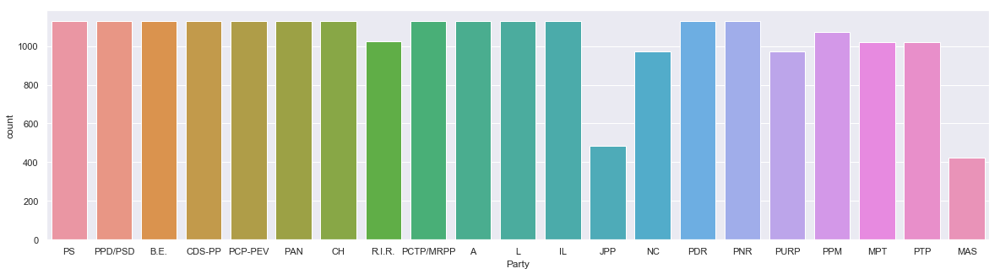

In [8]:
plt.figure(figsize=(20, 5))
#sns.countplot(x='Hours', hue='Income', data=df)
sns.countplot(df.territoryName)

plt.figure(figsize=(20, 5))
sns.countplot(df.Party)

# category data analysis on the basiss of TERITORY

Text(0, 0.5, 'totalVoters')

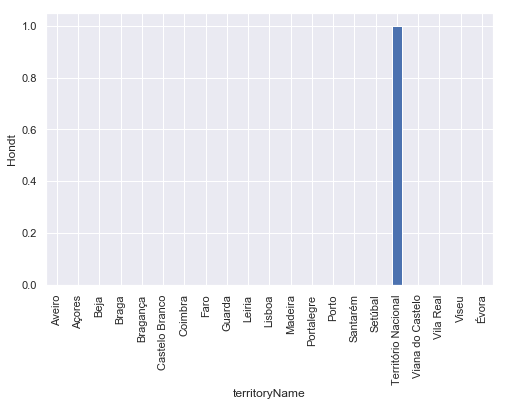

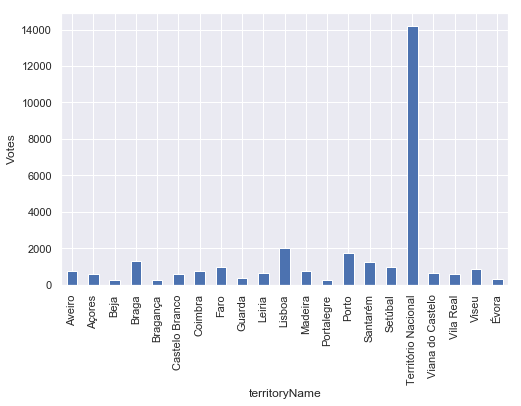

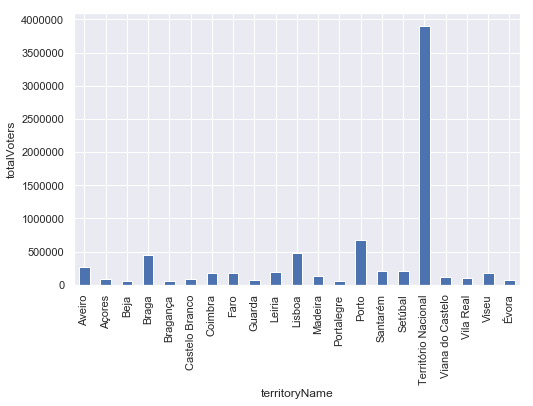

In [18]:

plt.figure(figsize=(8,5))
mpg=(df.groupby('territoryName')['Hondt'].median())

mpg.plot(kind='bar')
plt.ylabel('Hondt')
plt.figure(figsize=(8,5))
mpg=(df.groupby('territoryName')['Votes'].median())

mpg.plot(kind='bar')
plt.ylabel('Votes')
plt.figure(figsize=(8,5))
mpg=(df.groupby('territoryName')['totalVoters'].median())

mpg.plot(kind='bar')
plt.ylabel('totalVoters')



<Figure size 576x360 with 0 Axes>

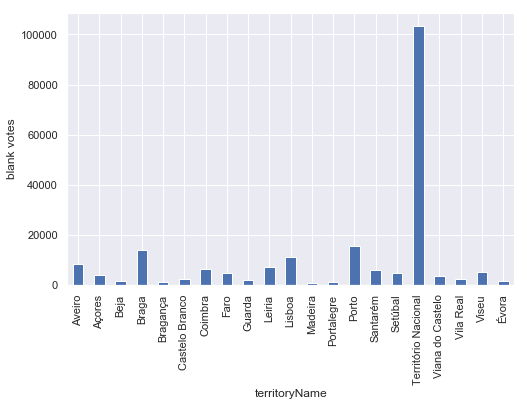

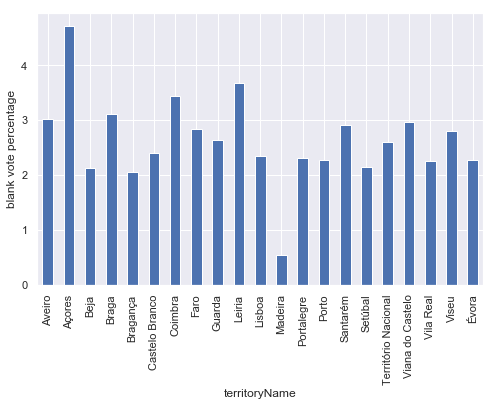

<Figure size 576x360 with 0 Axes>

In [19]:
plt.figure(figsize=(8,5))
mpg=(df.groupby('territoryName')['totalMandates'].median())
plt.figure(figsize=(8,5))
mpg=(df.groupby('territoryName')['blankVotes'].median())

mpg.plot(kind='bar')
plt.ylabel('blank votes')
plt.figure(figsize=(8,5))
mpg=(df.groupby('territoryName')['blankVotesPercentage'].median())

mpg.plot(kind='bar')
plt.ylabel('blank vote percentage')
plt.figure(figsize=(8,5))
mpg=(df.groupby('territoryName')['nullVotes'].median())





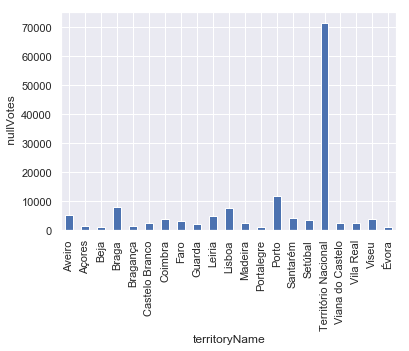

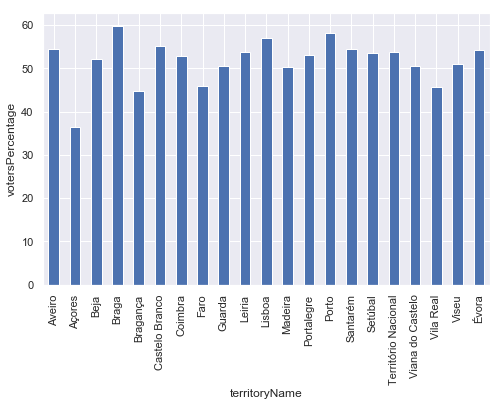

<Figure size 576x360 with 0 Axes>

In [20]:
mpg.plot(kind='bar')
plt.ylabel(' nullVotes')
plt.figure(figsize=(8,5))
mpg=(df.groupby('territoryName')['votersPercentage'].median())

mpg.plot(kind='bar')
plt.ylabel('votersPercentage')

plt.figure(figsize=(8,5))
mpg=(df.groupby('territoryName')['totalMandates'].median())

Text(0, 0.5, 'Number of parishes approved in this location')

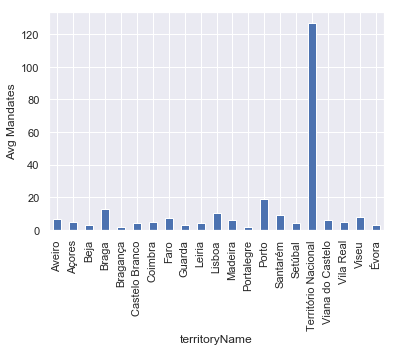

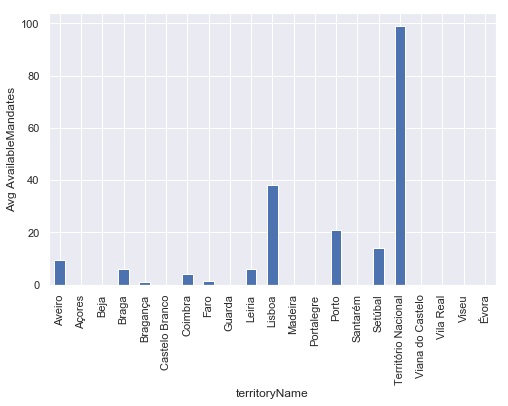

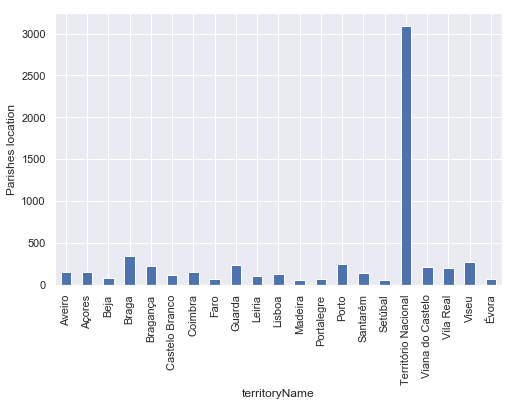

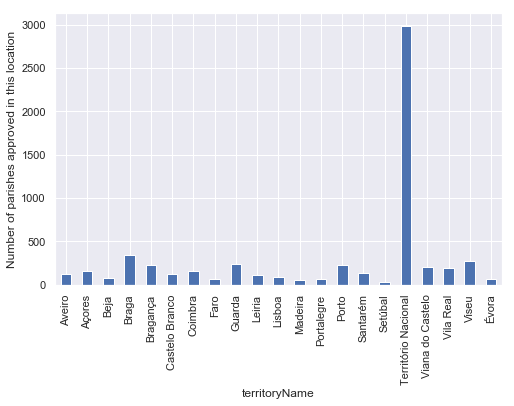

In [21]:
mpg.plot(kind='bar')
plt.ylabel('Avg Mandates')
plt.figure(figsize=(8,5))
mpg=(df.groupby('territoryName')['availableMandates'].median())

mpg.plot(kind='bar')
plt.ylabel('Avg AvailableMandates')
plt.figure(figsize=(8,5))
mpg=(df.groupby('territoryName')['numParishes'].median())

mpg.plot(kind='bar')
plt.ylabel('Parishes location')
plt.figure(figsize=(8,5))
mpg=(df.groupby('territoryName')['numParishesApproved'].median())

mpg.plot(kind='bar')
plt.ylabel('Number of parishes approved in this location')



# category data analysis on the basiss of PArty

Text(0, 0.5, 'blank votes')

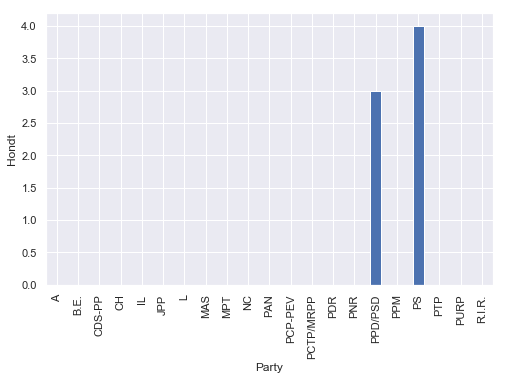

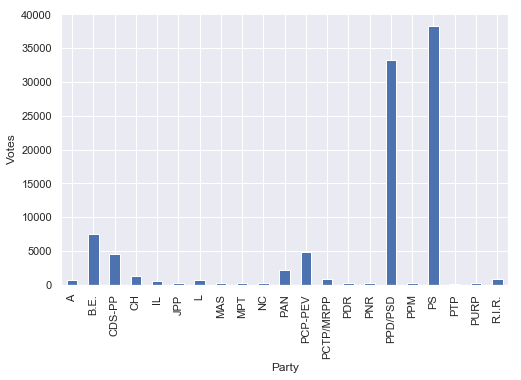

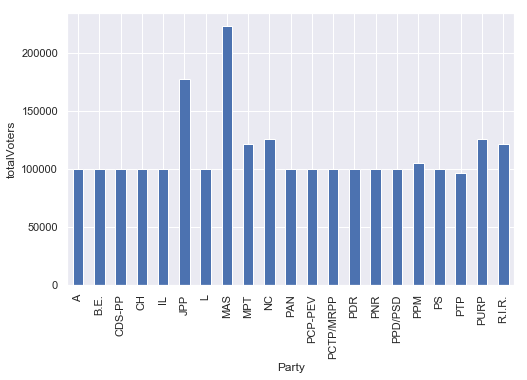

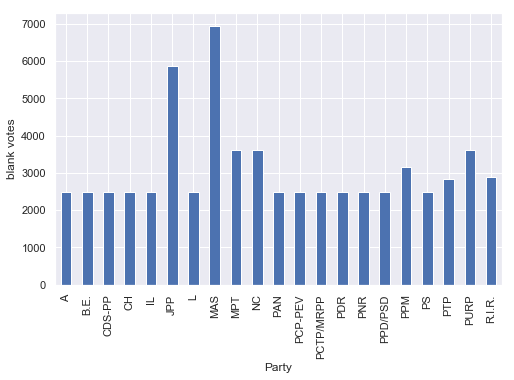

In [22]:

plt.figure(figsize=(8,5))
mpg=(df.groupby('Party')['Hondt'].median())

mpg.plot(kind='bar')
plt.ylabel('Hondt')
plt.figure(figsize=(8,5))
mpg=(df.groupby('Party')['Votes'].median())

mpg.plot(kind='bar')
plt.ylabel('Votes')
plt.figure(figsize=(8,5))
mpg=(df.groupby('Party')['totalVoters'].median())

mpg.plot(kind='bar')
plt.ylabel('totalVoters')


plt.figure(figsize=(8,5))
mpg=(df.groupby('Party')['blankVotes'].median())

mpg.plot(kind='bar')
plt.ylabel('blank votes')



Text(0, 0.5, 'Avg Mandates')

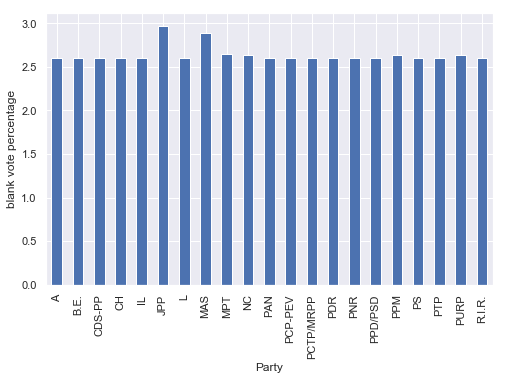

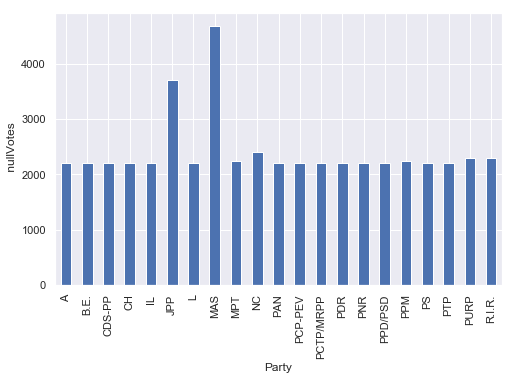

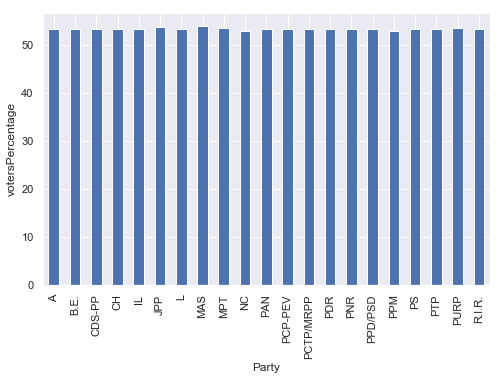

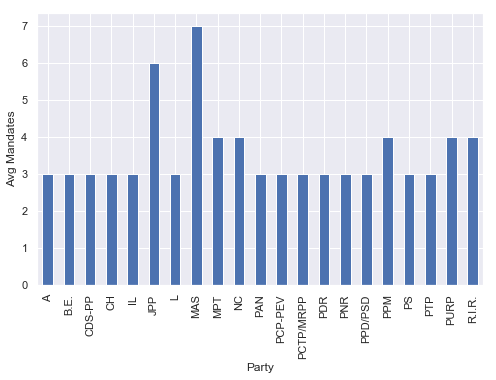

In [23]:
plt.figure(figsize=(8,5))
mpg=(df.groupby('Party')['blankVotesPercentage'].median())

mpg.plot(kind='bar')
plt.ylabel('blank vote percentage')
plt.figure(figsize=(8,5))
mpg=(df.groupby('Party')['nullVotes'].median())

mpg.plot(kind='bar')
plt.ylabel(' nullVotes')
plt.figure(figsize=(8,5))
mpg=(df.groupby('Party')['votersPercentage'].median())

mpg.plot(kind='bar')
plt.ylabel('votersPercentage')

plt.figure(figsize=(8,5))
mpg=(df.groupby('Party')['totalMandates'].median())

mpg.plot(kind='bar')
plt.ylabel('Avg Mandates')

Text(0, 0.5, 'Number of parishes approved in this location')

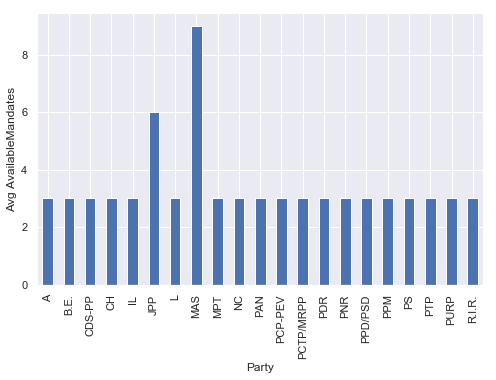

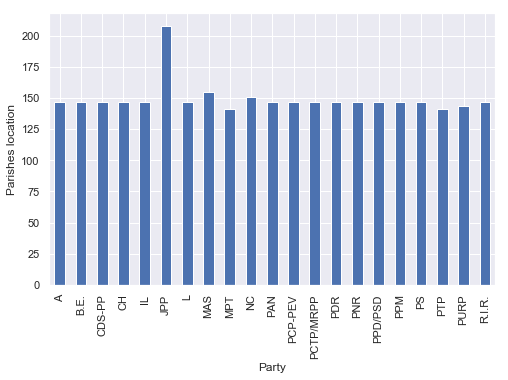

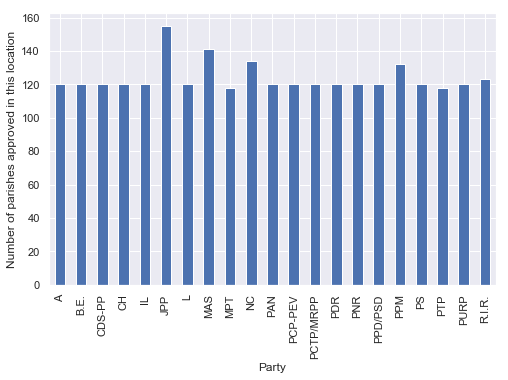

In [24]:
plt.figure(figsize=(8,5))
mpg=(df.groupby('Party')['availableMandates'].median())

mpg.plot(kind='bar')
plt.ylabel('Avg AvailableMandates')
plt.figure(figsize=(8,5))
mpg=(df.groupby('Party')['numParishes'].median())

mpg.plot(kind='bar')
plt.ylabel('Parishes location')
plt.figure(figsize=(8,5))
mpg=(df.groupby('Party')['numParishesApproved'].median())

mpg.plot(kind='bar')
plt.ylabel('Number of parishes approved in this location')

In [12]:
df.dtypes

TimeElapsed                   int64
time                         object
territoryName                object
totalMandates                 int64
availableMandates             int64
numParishes                   int64
numParishesApproved           int64
blankVotes                    int64
blankVotesPercentage        float64
nullVotes                     int64
nullVotesPercentage         float64
votersPercentage            float64
subscribedVoters              int64
totalVoters                   int64
pre.blankVotes                int64
pre.blankVotesPercentage    float64
pre.nullVotes                 int64
pre.nullVotesPercentage     float64
pre.votersPercentage        float64
pre.subscribedVoters          int64
pre.totalVoters               int64
Party                        object
Mandates                      int64
Percentage                  float64
validVotesPercentage        float64
Votes                         int64
Hondt                         int64
FinalMandates               

AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)


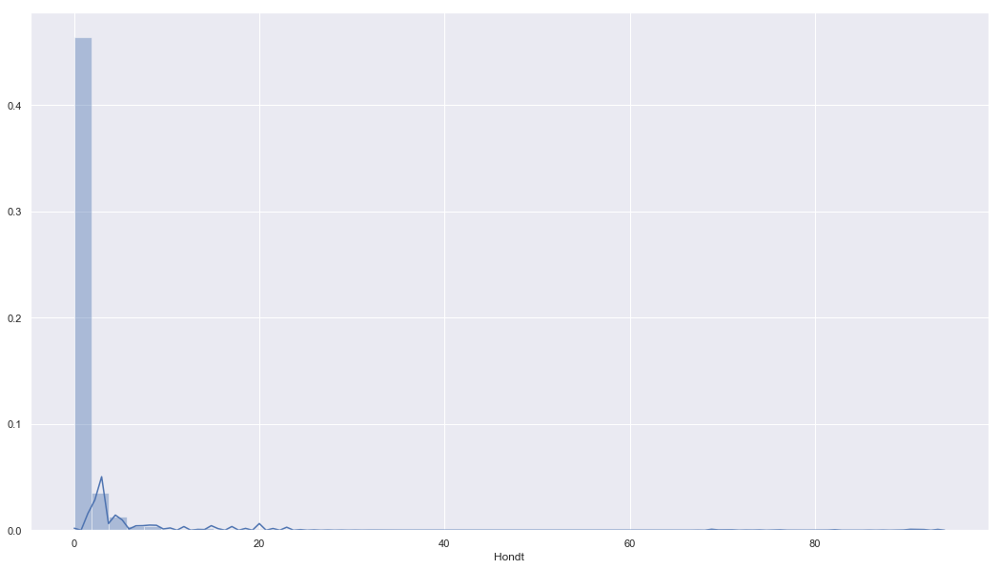

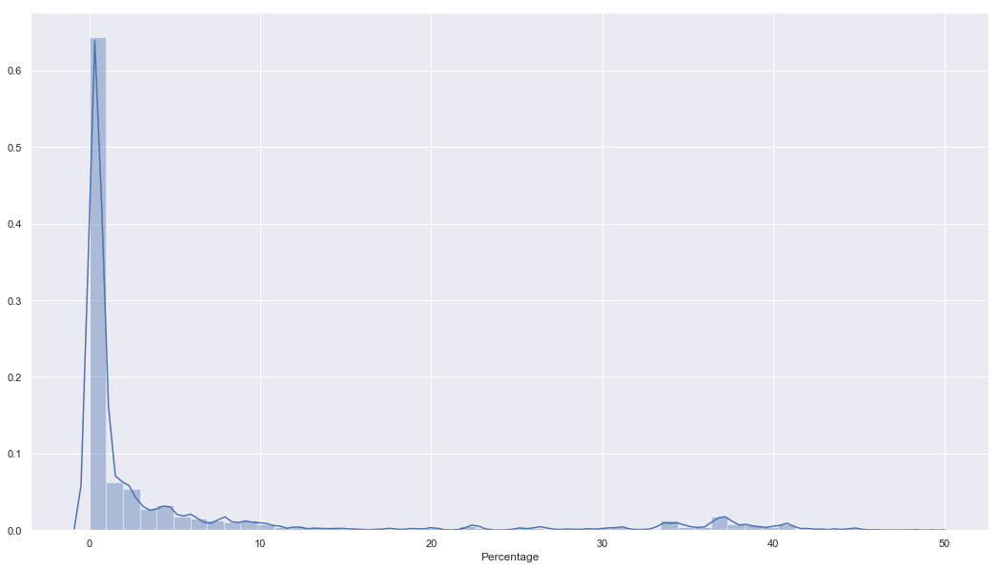

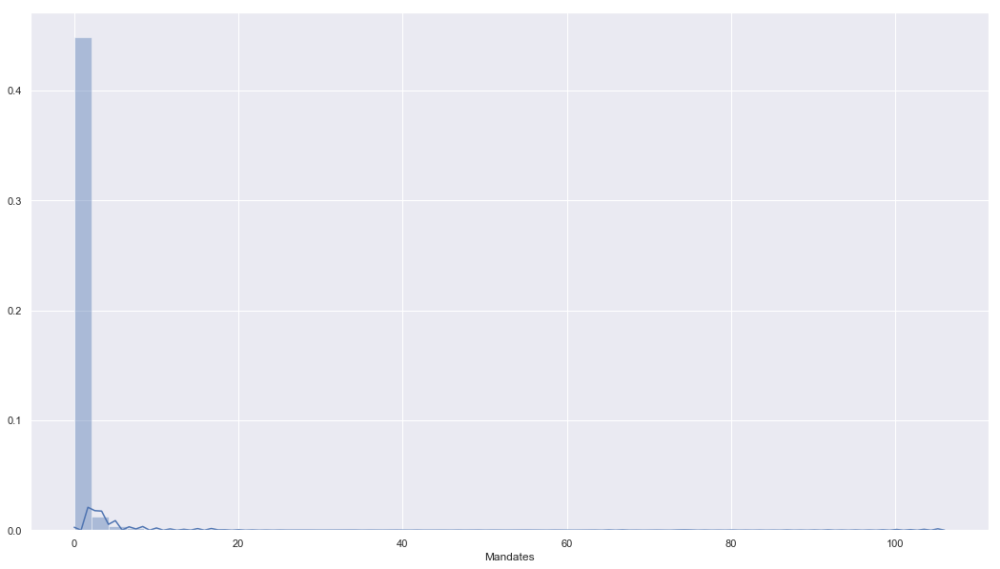

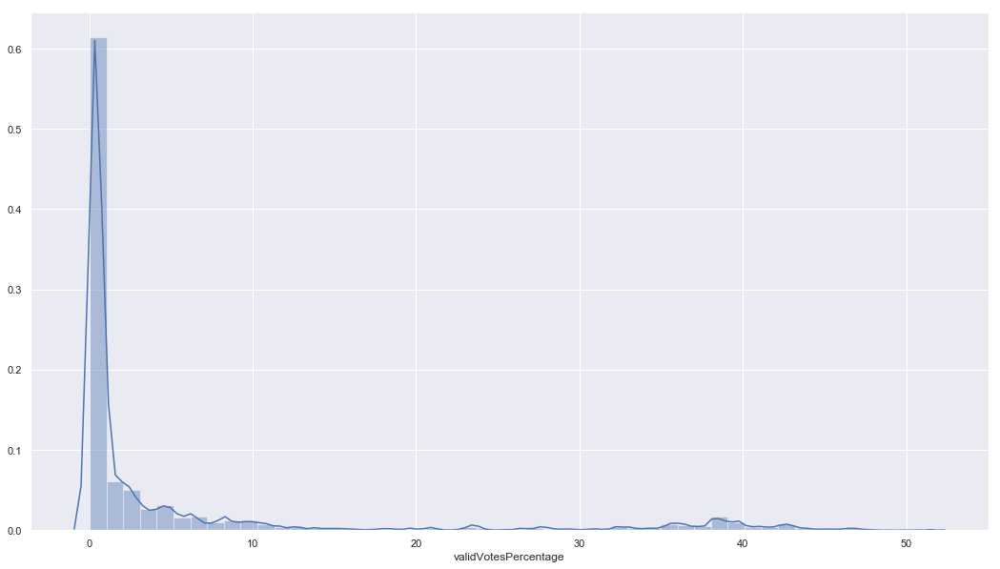

In [13]:
plt.figure(figsize=(18,10))
print(sns.distplot(df.Hondt))
plt.figure(figsize=(18,10))
print(sns.distplot(df.Percentage))
plt.figure(figsize=(18,10))
print(sns.distplot(df.Mandates))
plt.figure(figsize=(18,10))
print(sns.distplot(df.validVotesPercentage))



AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)


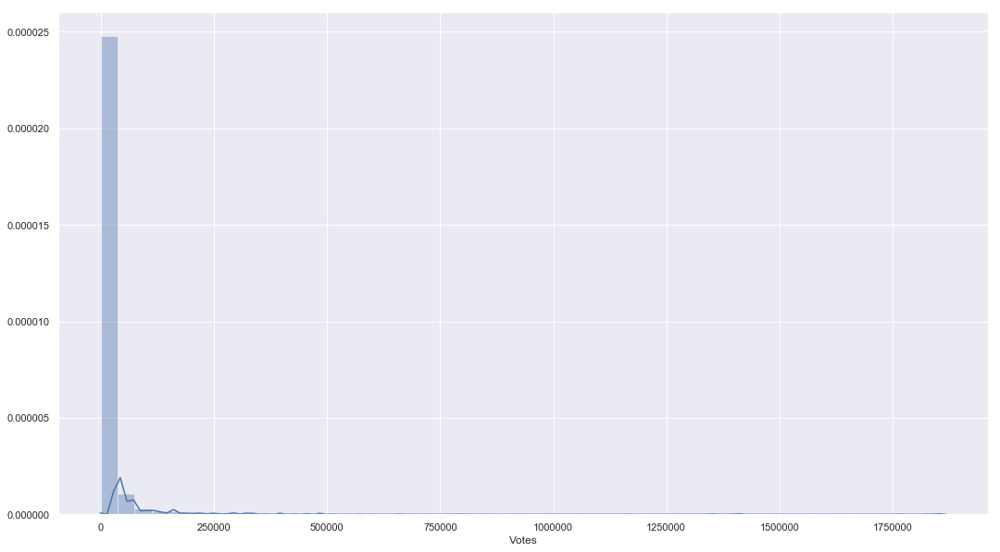

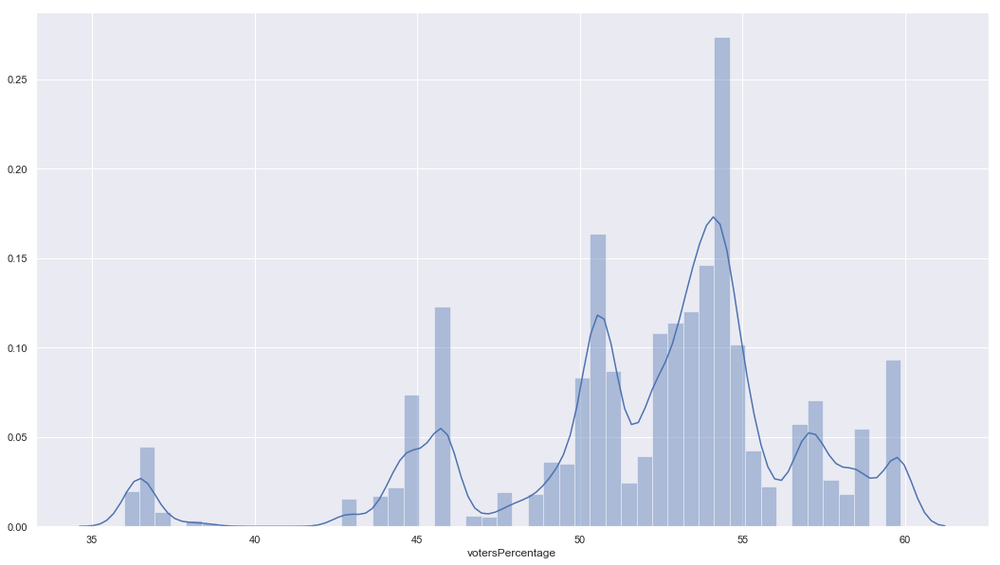

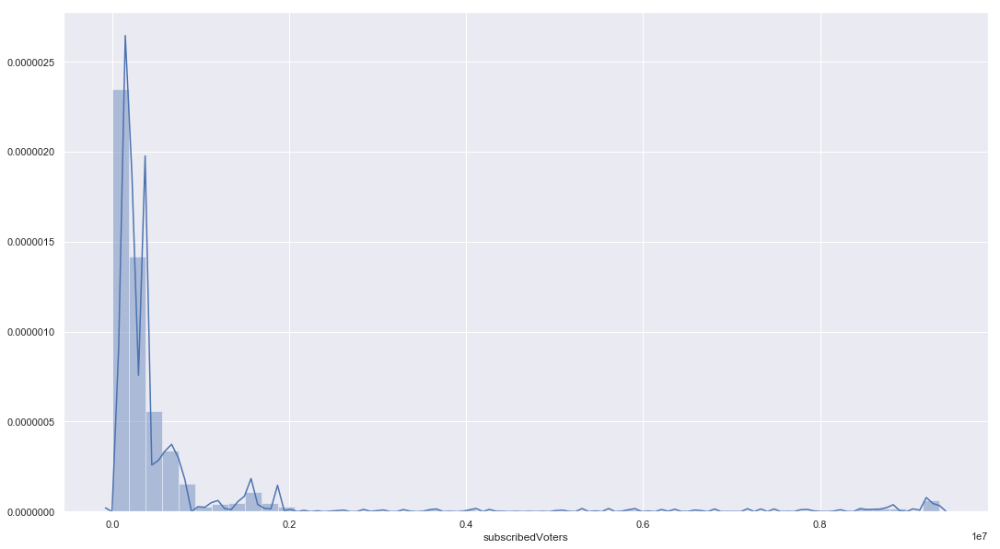

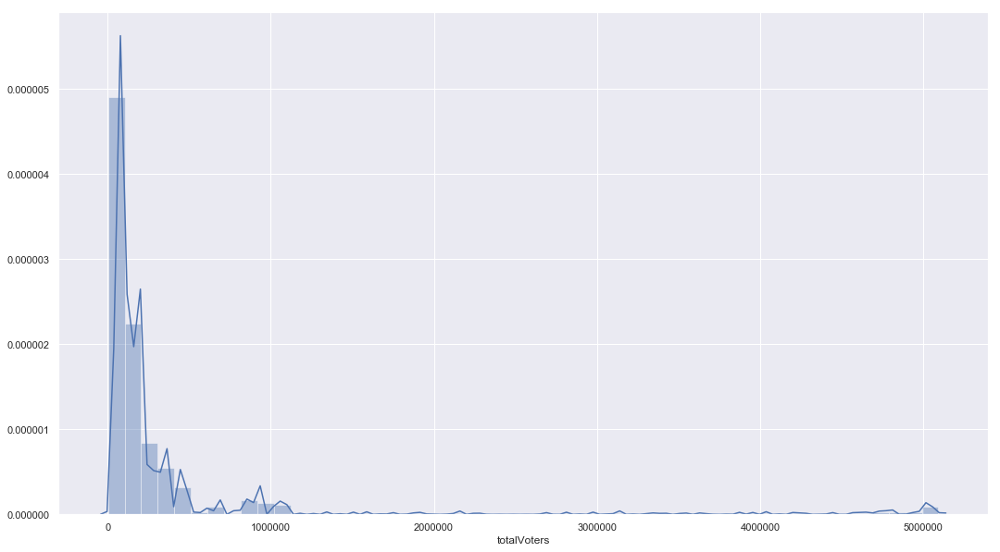

In [14]:
plt.figure(figsize=(18,10))
print(sns.distplot(df.Votes))
plt.figure(figsize=(18,10))
print(sns.distplot(df.votersPercentage))
plt.figure(figsize=(18,10))
print(sns.distplot(df.subscribedVoters))
plt.figure(figsize=(18,10))
print(sns.distplot(df.totalVoters))

AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)


<Figure size 1296x720 with 0 Axes>

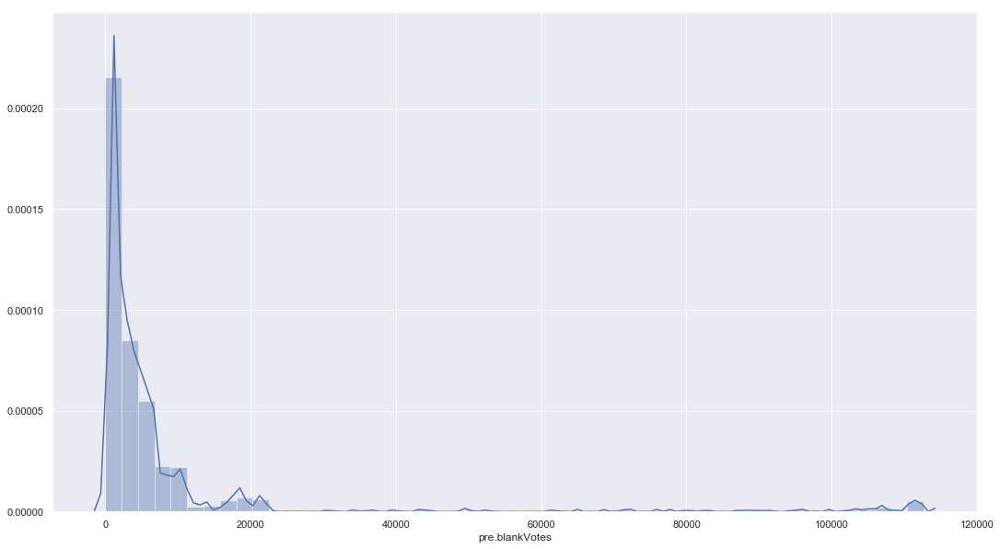

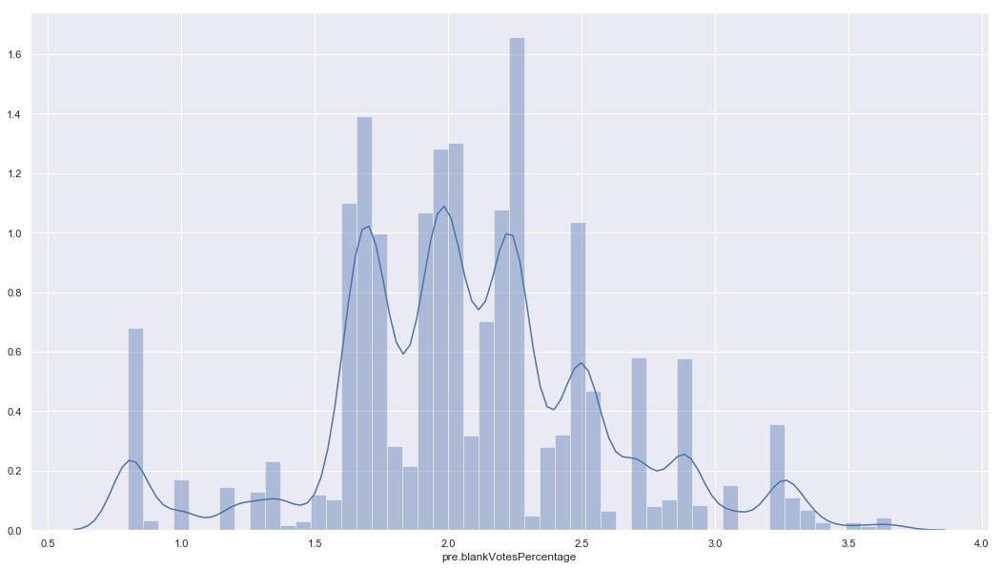

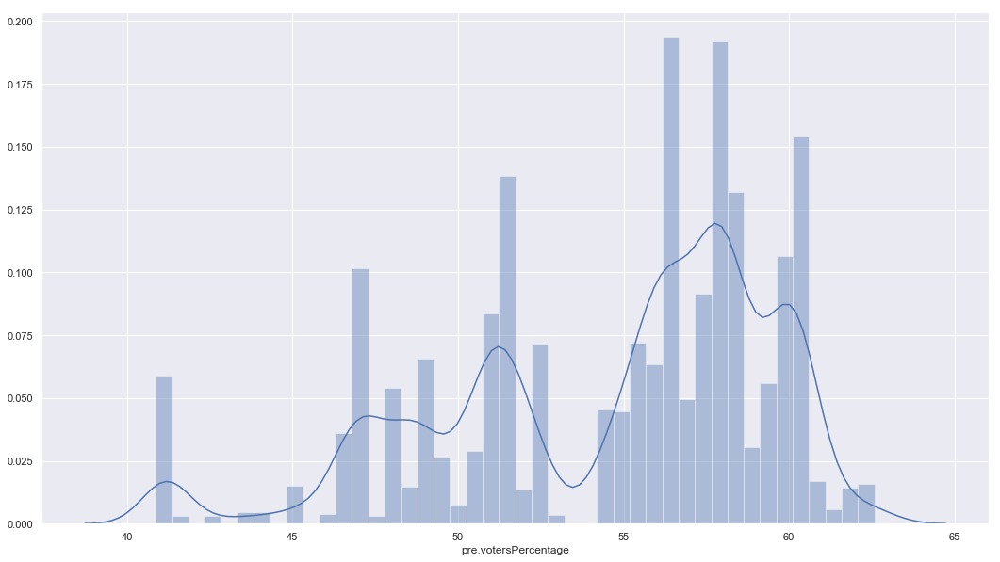

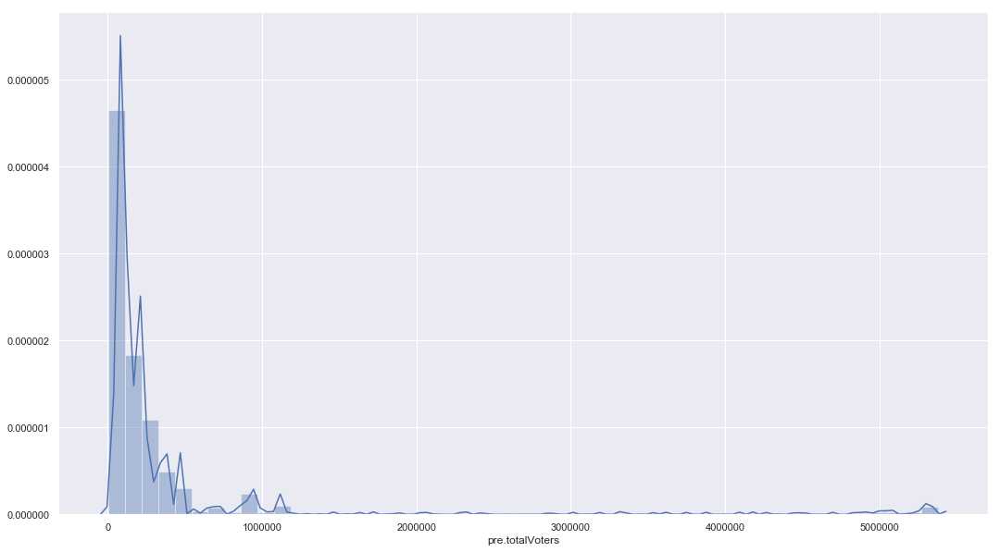

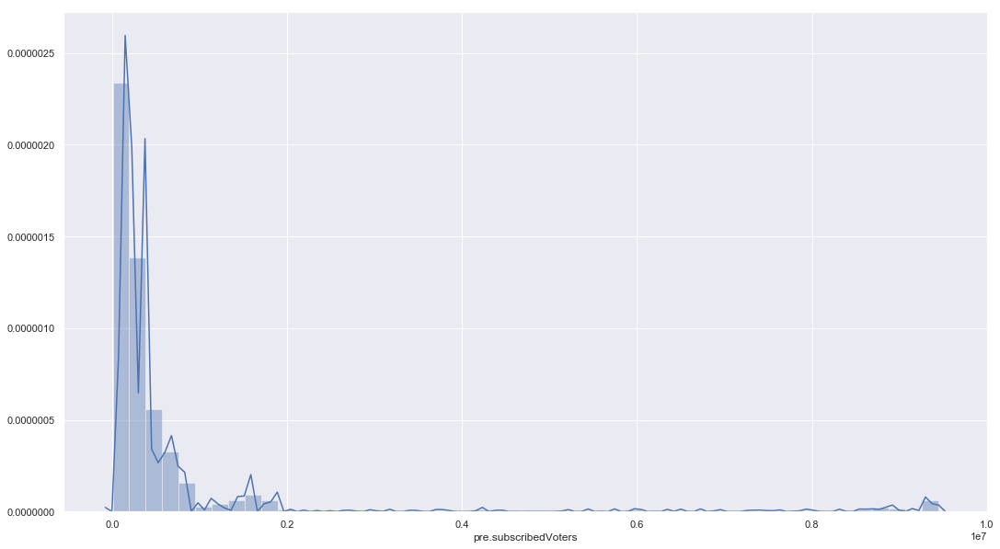

<Figure size 1296x720 with 0 Axes>

In [15]:
plt.figure(figsize=(18,10))
print(sns.distplot(df['pre.blankVotes']))
plt.figure(figsize=(18,10))
print(sns.distplot(df['pre.blankVotesPercentage']))
plt.figure(figsize=(18,10))
print(sns.distplot(df['pre.votersPercentage']))
plt.figure(figsize=(18,10))
print(sns.distplot(df['pre.totalVoters']))
plt.figure(figsize=(18,10))
print(sns.distplot(df['pre.subscribedVoters']))
plt.figure(figsize=(18,10))


AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)


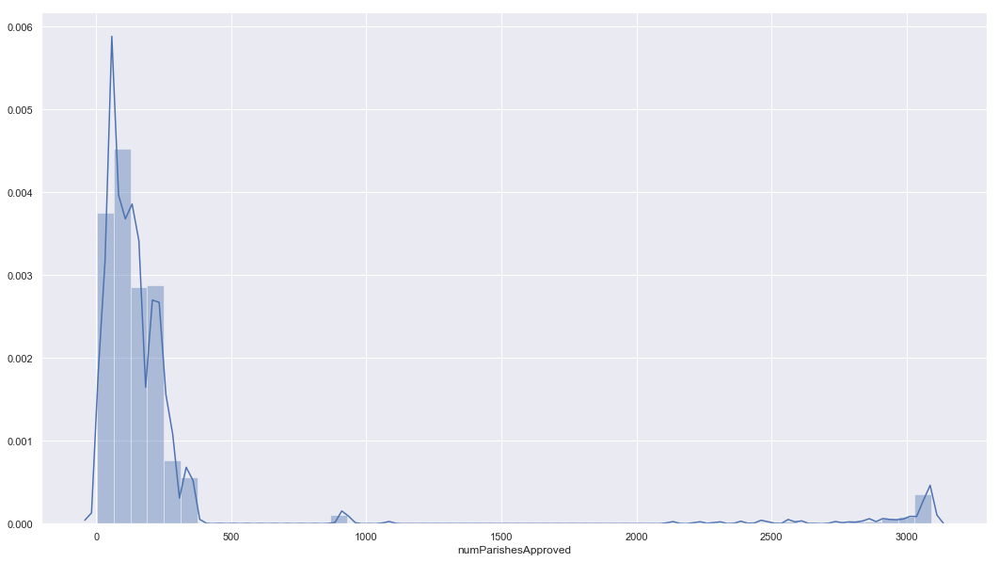

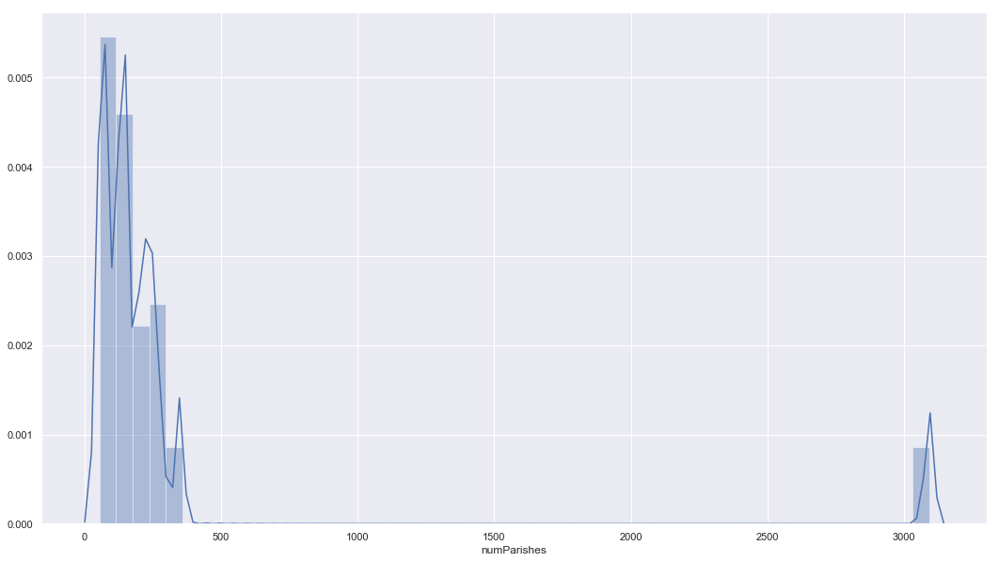

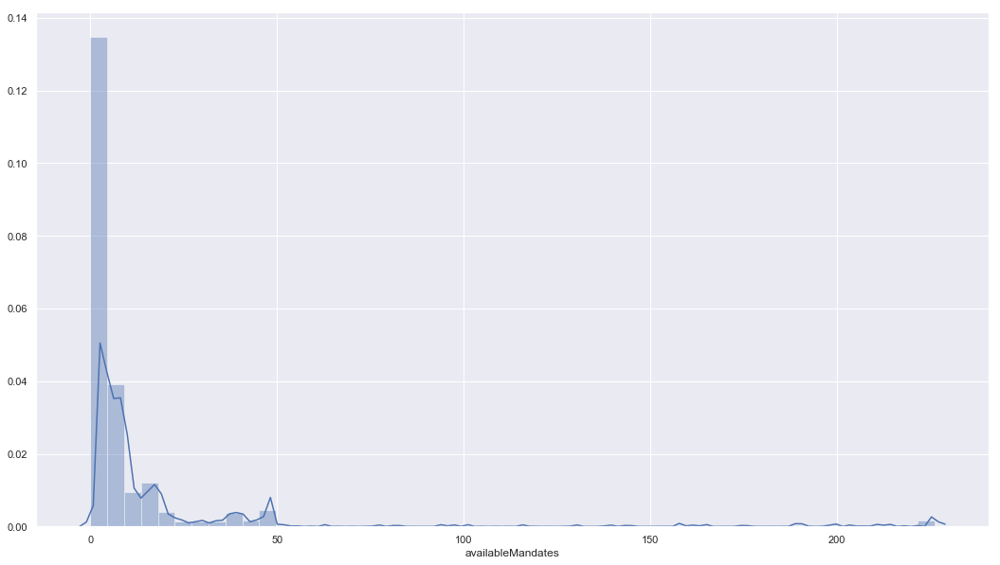

In [16]:
plt.figure(figsize=(18,10))
print(sns.distplot(df.numParishesApproved))
plt.figure(figsize=(18,10))
print(sns.distplot(df.numParishes))
plt.figure(figsize=(18,10))
print(sns.distplot(df.availableMandates))

AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)
AxesSubplot(0.125,0.125;0.775x0.755)


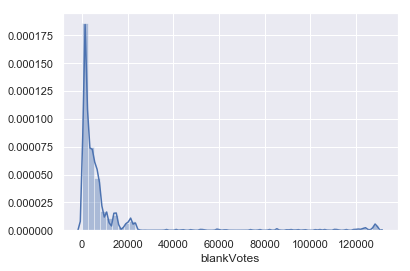

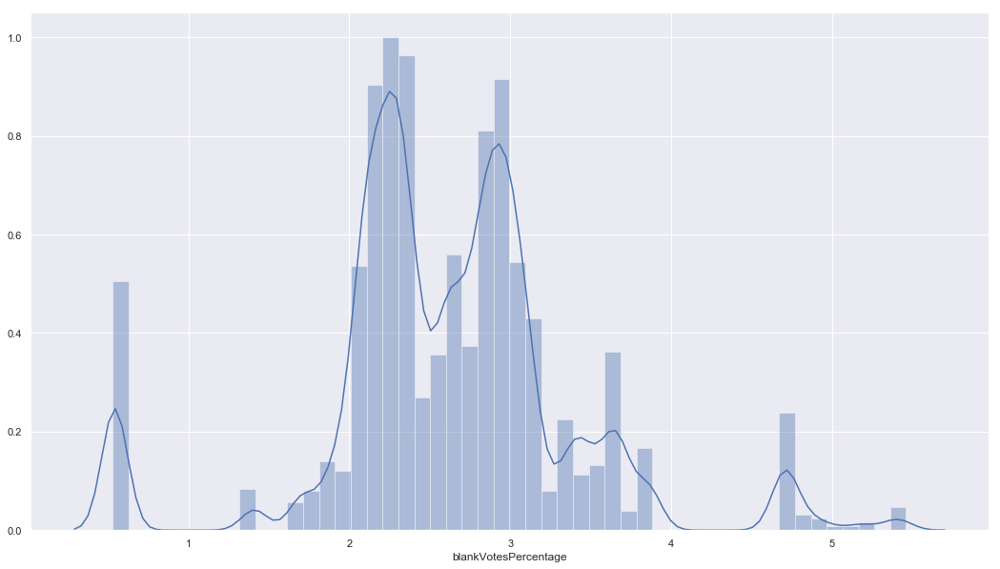

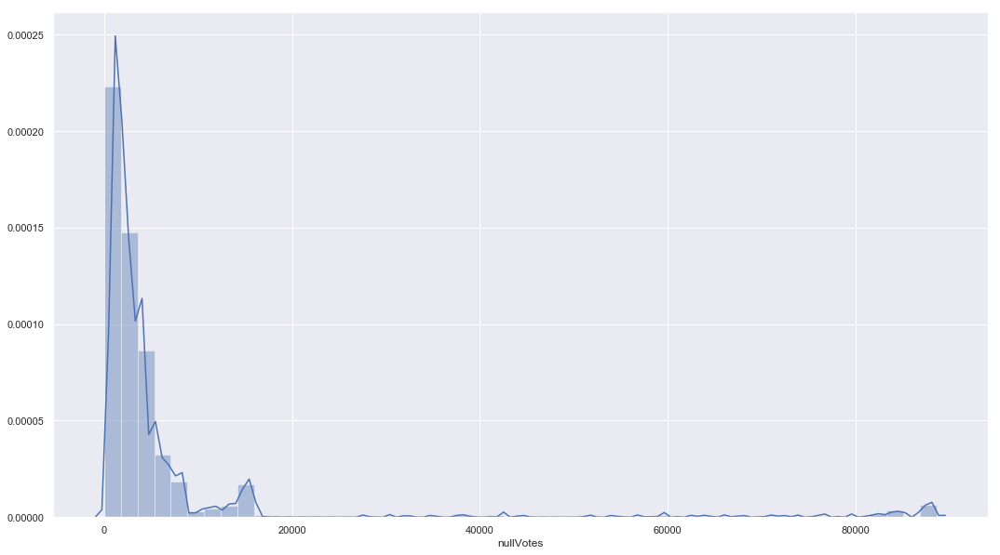

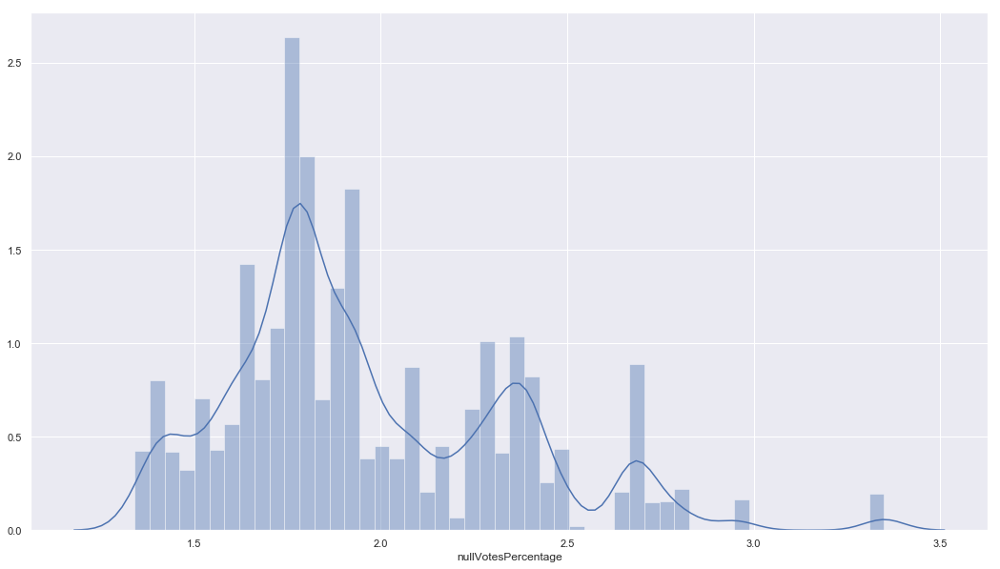

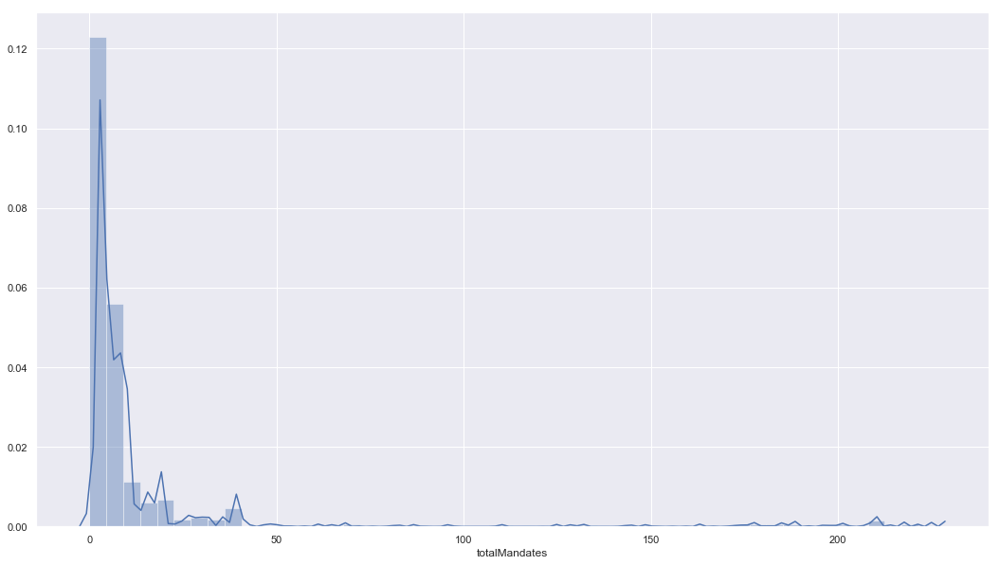

In [17]:
print(sns.distplot(df.blankVotes))
plt.figure(figsize=(18,10))
print(sns.distplot(df.blankVotesPercentage))
plt.figure(figsize=(18,10))
print(sns.distplot(df.nullVotes))
plt.figure(figsize=(18,10))
print(sns.distplot(df.nullVotesPercentage))
plt.figure(figsize=(18,10))
print(sns.distplot(df.totalMandates))

<Figure size 2160x2160 with 0 Axes>

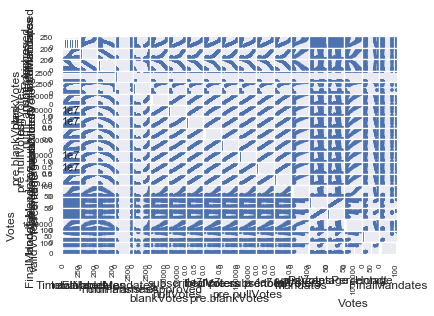

In [29]:
plt.figure(figsize=(30, 30))
scatter_matrix(df)
plt.show()

C:\Users\GT\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)
C:\Users\GT\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\GT\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


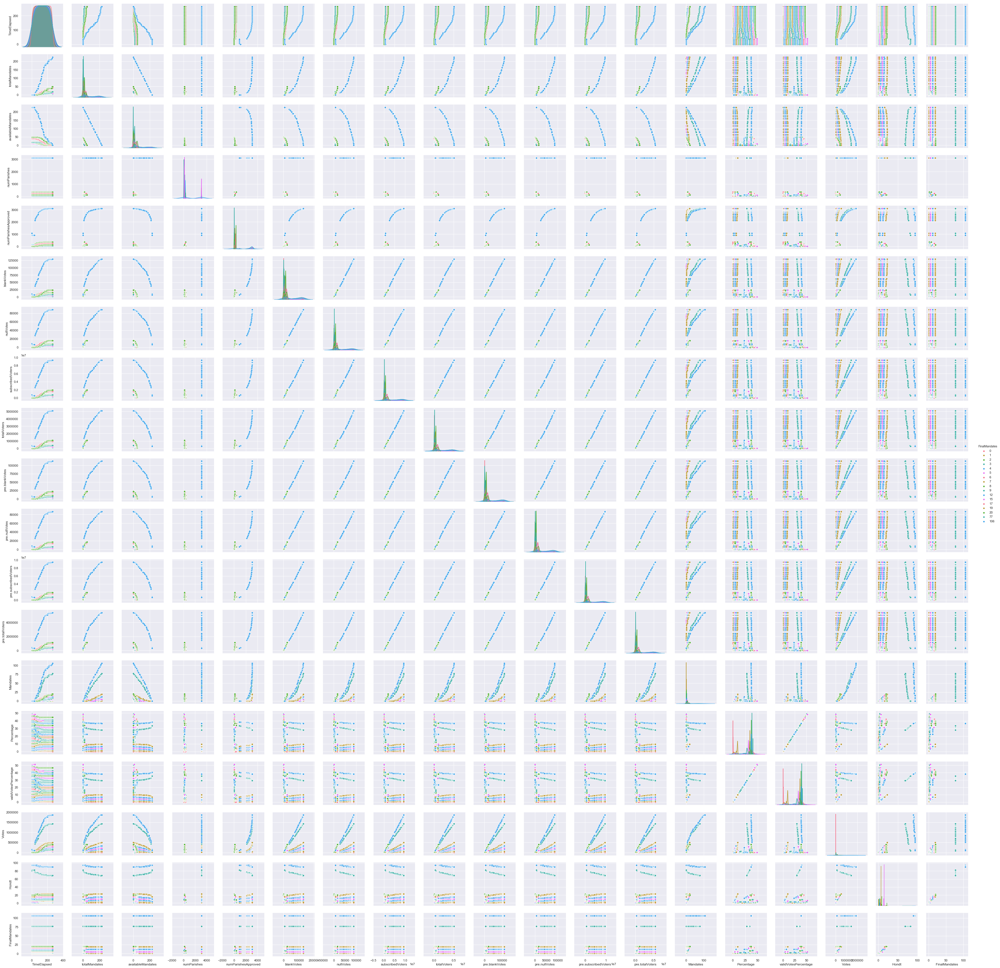

In [30]:
sns.pairplot(df,hue='FinalMandates',
             palette = sns.color_palette("husl"), size=2.5)

In [39]:
import plotly.express as px
fig = px.line(df, y='Votes', x='time')
fig.show()

In [45]:
fig = px.line(df, x='TimeElapsed', y='Votes')
fig.show()

In [51]:
df.columns

Index(['territoryName', 'totalMandates', 'numParishes', 'blankVotes',
       'nullVotes', 'subscribedVoters', 'totalVoters', 'pre.nullVotes',
       'Party', 'Mandates', 'Percentage', 'validVotesPercentage', 'Votes',
       'Hondt', 'FinalMandates'],
      dtype='object')

In [49]:
df=df.drop(['time','blankVotesPercentage','TimeElapsed','numParishesApproved','pre.totalVoters','pre.subscribedVoters','availableMandates','pre.blankVotes','nullVotesPercentage','votersPercentage','pre.blankVotesPercentage','pre.nullVotesPercentage','pre.votersPercentage'],axis=1)

In [50]:
df.shape

(21643, 15)

In [52]:
array = df.values
X = array[:,0:14]
Y = array[:,14]

In [54]:
from sklearn.preprocessing import LabelEncoder

df1= list(df.select_dtypes(include=['object']).columns)
label_encoder_feat = {}
for i, feature in enumerate(df1):
    label_encoder_feat[feature] = LabelEncoder()
    df[feature] = label_encoder_feat[feature].fit_transform(df[feature])

df.head(3)

,territoryName,totalMandates,numParishes,blankVotes,nullVotes,subscribedVoters,totalVoters,pre.nullVotes,Party,Mandates,Percentage,validVotesPercentage,Votes,Hondt,FinalMandates
0,16,0,3092,9652,8874,752529,386497,8171,17,0,38.29,40.22,147993,94,106
1,16,0,3092,9652,8874,752529,386497,8171,15,0,33.28,34.95,128624,81,77
2,16,0,3092,9652,8874,752529,386497,8171,1,0,6.81,7.15,26307,16,19


In [57]:
from sklearn.utils import shuffle
df = shuffle(df)

# Splitting the data set into train and test set
from sklearn.model_selection import train_test_split

features_ = df.drop(columns = ['FinalMandates'])
target = df['FinalMandates']
X_train, X_test, y_train, y_test = train_test_split(features_, target, test_size = 0.2,random_state = 0)

print ("Train data set size : ", X_train.shape)
print ("Test data set size : ", X_test.shape)

Train data set size :  (17314, 14)
Test data set size :  (4329, 14)


In [58]:

from xgboost import XGBClassifier
from xgboost import plot_importance

# Training the model
model = XGBClassifier()
model_importance = model.fit(X_train, y_train)



C:\Users\GT\Anaconda3\lib\site-packages\dask\config.py:168: YAMLLoadWarning:

calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.

C:\Users\GT\Anaconda3\lib\site-packages\distributed\config.py:20: YAMLLoadWarning:

calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.

C:\Users\GT\Anaconda3\lib\site-packages\distributed\utils.py:134: RuntimeWarning:

Couldn't detect a suitable IP address for reaching '8.8.8.8', defaulting to '127.0.0.1': [WinError 10065] A socket operation was attempted to an unreachable host



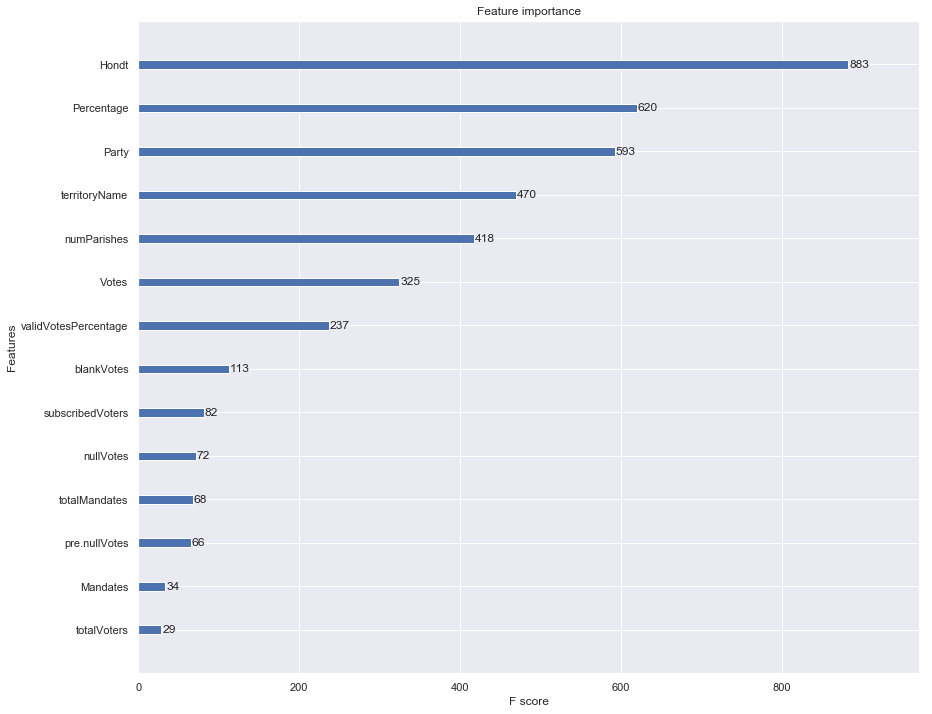

In [59]:
# Plotting the Feature importance bar graph
plt.rcParams['figure.figsize'] = [14,12]
sns.set(style = 'darkgrid')
plot_importance(model_importance)

In [62]:
pred=model_importance.predict(X_test)
print ("The accuracy of model 3 : ",accuracy_score(y_test, pred))
print ("The f1 score of model 3 : ", f1_score(y_test, pred, average = 'micro'))

The accuracy of model 3 :  0.9997689997689998
The f1 score of model 3 :  0.9997689997689998


In [64]:
print("Confusion Matrix on Test Data")
pd.crosstab(y_test, pred, rownames=['True'], colnames=['Predicted'], margins=True)

Confusion Matrix on Test Data


Predicted,0,1,2,3,4,5,6,7,8,9,12,15,17,19,20,77,106,All
True,,,,,,,,,,,,,,,,,,
0,3567,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3567
1,0,220,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,220
2,0,0,127,0,0,0,0,0,0,0,0,0,0,0,0,0,0,127
3,0,0,0,124,0,0,0,0,0,0,0,0,0,0,0,0,0,124
4,0,0,1,0,62,0,0,0,0,0,0,0,0,0,0,0,0,63
5,0,0,0,0,0,66,0,0,0,0,0,0,0,0,0,0,0,66
6,0,0,0,0,0,0,10,0,0,0,0,0,0,0,0,0,0,10
7,0,0,0,0,0,0,0,11,0,0,0,0,0,0,0,0,0,11
8,0,0,0,0,0,0,0,0,26,0,0,0,0,0,0,0,0,26


# RAndom forest

In [67]:
R_forest = RandomForestClassifier(n_estimators = 200)
model_2 = R_forest.fit(X_train, y_train)

# Predictions
pred_2 = model_2.predict(X_test)

print ("The accuracy of model 2 : ",accuracy_score(y_test, pred_2))
print ("The f1 score of model 2 : ", f1_score(y_test, pred_2, average = 'None'))

The accuracy of model 2 :  0.9983829983829984


ValueError: Target is multiclass but average='binary'. Please choose another average setting, one of [None, 'micro', 'macro', 'weighted'].